In [2]:
%load_ext autoreload
%autoreload 2

import numpy as np
import sys, os
import signac
from tqdm import tqdm_notebook as tqdm
from matplotlib import pyplot as plt
from matplotlib import colors, cm, patches
from IPython.display import clear_output

# change to where kernel-tutorials is installed
kernel_tutorials_path = '../../../../kernel-tutorials'
sys.path.append(kernel_tutorials_path)

from utilities.general import FPS, sorted_eig, get_stats, eig_inv
from utilities.CUR import CUR, get_Ct
from utilities.plotting import plot_regression, plot_projection, get_cmaps
from utilities.classes import PCovR
from utilities.kpcovr import KPCovR
from utilities.colorbars import cbarHot, cbarBWR, cbarPhi

sys.path.append('../../scripts/')
from pcovr_plotting import plot_regrs, plot_projs
from operations import check_all_mirrors
from cmap2D import colormap2d 

hot=cbarHot()
bwr=cbarBWR()
phi=cbarPhi()

cmaps = get_cmaps()

project=signac.get_project()
scp = dict(project.document.scp)
scp['cmap2D'] = colormap2d
scp['s'] = scp['s']/2.
scp['linewidth'] = 0.25
scp.pop('alpha')
props = dict(boxstyle='round', facecolor='w')
cmapX = cbarHot()
precision = 10

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


ModuleNotFoundError: No module named 'utilities.CUR'

In [2]:
job=project.open_job(id='939')

if(not os.path.exists(job.fn('figures/for_gif'))):
    os.mkdir(job.fn('figures/for_gif'))
    
sp = dict(job.sp)
sp.pop('n_PC')
assert job.sp.n_PC == 2 or len(project.find_jobs(sp)==1)

# PCovR

In [3]:
test = np.load(job.fn('testing.npz'))
train = np.load(job.fn('training.npz'))

X_test = test["X"]
Y_test = test["Y"]
X_train = train["X"]
Y_train = train["Y"]
print(test['X'].shape)

if(X_test.shape[-1]>6000):
    
    X_test = test["X"][:2000]
    Y_test = test["Y"][:2000]
    X_train = train["X"][:2000]
    Y_train = train["Y"][:2000]
    
print(X_test.shape)

(5437, 448)
(5437, 448)


In [4]:
if(job.isfile('figures/for_gif/pcovr_data.npz')):
    d = np.load(job.fn('figures/for_gif/pcovr_data.npz'), allow_pickle=True)
    proj_data = {float(x): d[x].item() for x in d if 'flip' not in x and x!='checked'}
    fx = list(d['flip_x'])
    fy = list(d['flip_y'])
else:
    print("Starting anew")
    proj_data = {}
    fx = []; fy = [];

In [5]:
alphas = np.array(list(sorted(set([*[round(x,6) for x in np.linspace(0,1,101)],
#                           *[round(x,10) for p in range(-4,0) for i in range(10) for x in [i*10**p, 1.0 - i*10**p] ]
                                  ]))))
alphas = alphas[alphas<=1.0].tolist()

# if(Y_train.shape[-1] > 4):
#     alphas = [a for i,a in enumerate(alphas) if i%5==0 or (a<=0.6 and a>=0.4)]
#     print(len(alphas))

In [6]:
fps_idx = job.document.get('fps_idx', train.get('fps_compute'))
for ai, alpha in enumerate(tqdm(alphas)):
    if(alpha not in proj_data):
        p = PCovR(alpha = alpha, 
                  regularization=job.document.regularization_param,
                  n_PC = job.sp.n_PC,
                  space='feature',
                 )
        p.fit(X_train[:, fps_idx], Y_train)
        t, y, _ = p.transform(X_test[:, fps_idx])
        proj_data[alpha] = {"T_test": t, "Yp_test": y}

/var/folders/wj/7rfv11952g53zf6ztk8k8g980000gn/T/ipykernel_82267/135602469.py:2: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for ai, alpha in enumerate(tqdm(alphas)):


  0%|          | 0/101 [00:00<?, ?it/s]

In [7]:
fx, fy = check_all_mirrors([], [], alphas, proj_data)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 101/101 [00:05<00:00, 18.20it/s]


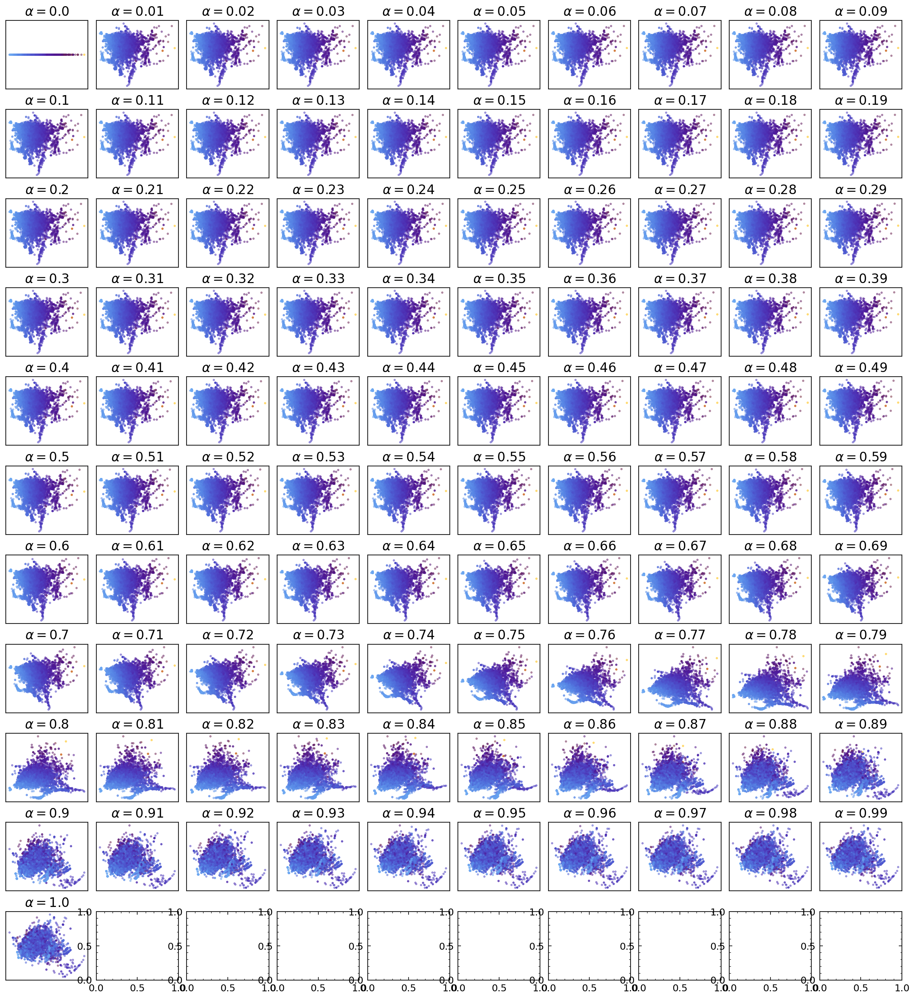

In [8]:
x=plot_projs(job, 'pcovr', 
           proj_data=proj_data, 
           alphas=alphas, Y_test=Y_test,
           flip_x = fx, flip_y = fy,
           save=False)

In [9]:
np.savez(job.fn('figures/for_gif/pcovr_data.npz'), 
         **{str(x): proj_data[x] for x in proj_data}, 
         flip_x=fx, 
         flip_y=fy)

In [22]:
from ase.io import read

frames = np.array(read('../../../datasets/C-VII-pp-wrapped.xyz',":"))
test_frames = frames[job.document.frame_indices][job.document.test_idx]

keys = ['average_bond_angle',
        'average_nbonds'
       ]

new_props = np.array([[test_frame.info[k] for k in keys] for test_frame in test_frames])

def scale_point(point, my_bounds=[[ 60., 180.],[  1.,   6.]]):
    return np.array([(point[i] - my_bounds[i][0])/(my_bounds[i][1] - my_bounds[i][0]) for i in range(2)])

gaussian_width = 0.08
def gaussian_func(c=(0,0), w=gaussian_width):
    return lambda p: np.round(np.exp(-np.linalg.norm(p-c)**2.0/(2*(w**2.0))),1)

vmin = [60., 1.0]
vmax = [180., 6.0]
my_bounds = np.transpose([vmin, vmax])
ideals = np.array([[180,2], [120,3], [109.5,4]])
gaussian_colors = np.array([cm.get_cmap(scp['cmapX'])(1.0), 
                            cm.get_cmap(scp['cmapX'])(0.2), 
                            cm.get_cmap(scp['cmapX'])(0.5)] )
relative_ideals = np.array([scale_point(p, my_bounds) for p in ideals])

gaussians = [gaussian_func(c=r, w=gaussian_width) for r in relative_ideals]


def gaussian_color(p, grey_max = 0.9):
    def scale_color(p, x):
        return np.array([(grey_max - pp) * (1.0 - x) + pp for pp in p])
    p_rel = scale_point(p, my_bounds)
    gvals = [g(p_rel) for g in gaussians]
    
    if(sum(gvals)>0):
        rgb = np.sum([gv*scale_color(gc, gv) for gv, gc in zip(gvals, gaussian_colors)], axis=0) / np.sum(gvals)
        a = np.max(gvals)

#         rgb_new = [min(grey_max, (grey_max-r)*(1.0-a)) + r for r in rgb]
        return np.array([*rgb[:3]])#_new[:3]])
    else:
        return grey_max*np.ones(3)
    
    
cmap = gaussian_color

# add a 2D colorbar beneath the plots
n=100
cbar = np.zeros((n,n,cmap((0.0,0.0)).shape[0]))

for xi,x in enumerate(np.linspace(vmin[0], vmax[0], n)):
    for yi, y in enumerate(np.linspace(vmin[1], vmax[1], n)):
        cbar[xi, yi] = cmap((x,y))

/var/folders/wj/7rfv11952g53zf6ztk8k8g980000gn/T/ipykernel_82267/1381338891.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  frames = np.array(read('../../../datasets/C-VII-pp-wrapped.xyz',":"))


/var/folders/wj/7rfv11952g53zf6ztk8k8g980000gn/T/ipykernel_82267/4026795067.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for alpha in tqdm(alphas):


  0%|          | 0/101 [00:00<?, ?it/s]

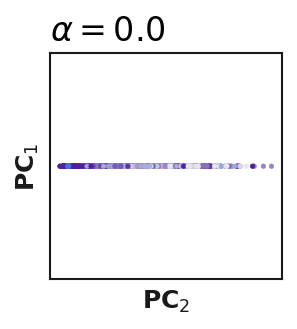

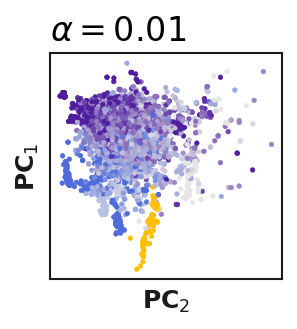

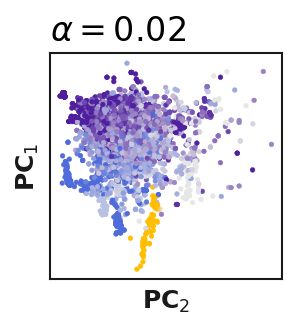

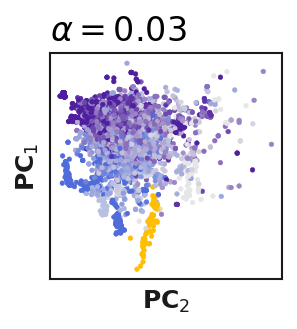

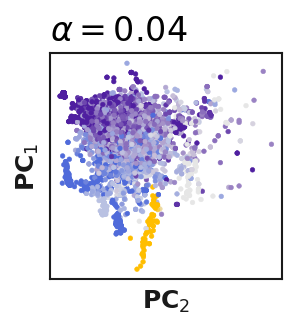

...

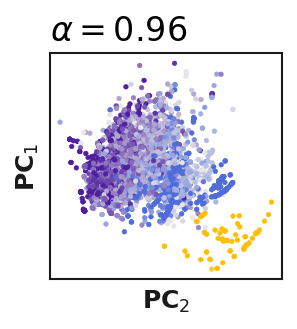

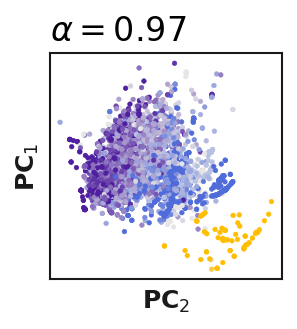

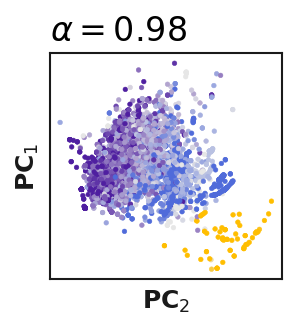

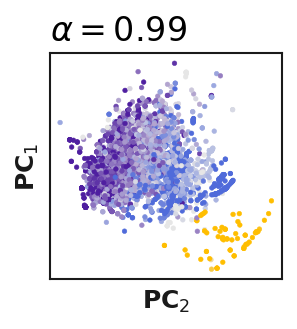

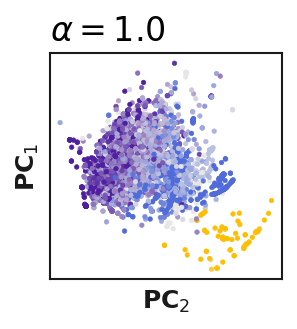

In [30]:
if(not os.path.exists(job.fn('figures/for_gif/sp_projections'))):
    os.mkdir(job.fn('figures/for_gif/sp_projections'))
    
for alpha in tqdm(alphas):
    fn = 'figures/for_gif/sp_projections/pcovr_%0.8f'%alpha + '.png'
    if(not job.isfile(fn)):

        fig, ax = plt.subplots(figsize=(2,2))
        
        T = proj_data[alpha]['T_test'][:, :2]
        if(alpha in fx):
            T = np.matmul(T, [[-1, 0], [0, 1]])
        if(alpha in fy):
            T = np.matmul(T, [[1, 0], [0, -1]])
            
        if(Y_test.shape[-1] == 1):
            vmin, vmax = new_props.min(axis=0), new_props.max(axis=0)
        else:
            vmin = new_props.mean(axis=0) - 2*new_props.std(axis=0)
            vmax = new_props.mean(axis=0) + 2*new_props.std(axis=0)   
        
        plot_projection(
            Y=new_props,
            T=T,
            fig=fig, ax=ax,
#             vmin=vmin, vmax=vmax,
            cbar=False,
            colormap=gaussian_color,
#             cmap2D=gaussian_color,
            x_label=r'$\mathbf{PC}_2$',
            y_label=r'$\mathbf{PC}_1$',
            marker='o',
            rasterized=True,
            **{k: scp[k] for k in scp if k not in ['cmapX', 'cmap2D']},
        )
        
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_title(r'$\alpha=$'+str(round(alpha, precision)),
                     horizontalalignment='left',loc='left',
                    )
        
        fig.savefig(job.fn(fn))
        plt.show()

/var/folders/wj/7rfv11952g53zf6ztk8k8g980000gn/T/ipykernel_82267/1179261327.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for alpha in tqdm(alphas):


  0%|          | 0/101 [00:00<?, ?it/s]

0.0 (-1.8, 1.0)


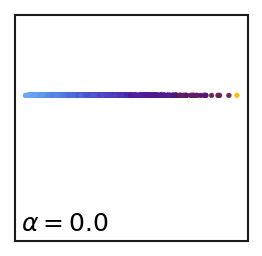

0.01 (-1.8, 1.0)


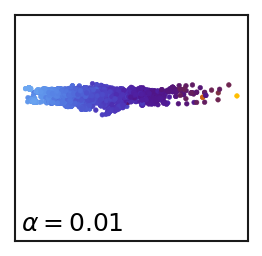

0.02 (-1.8, 1.0)


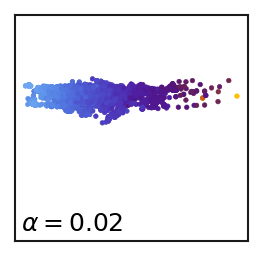

0.03 (-1.8, 1.0)


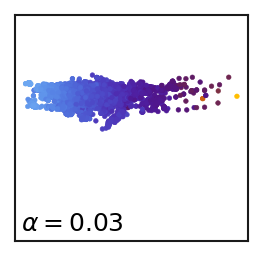

0.04 (-1.8, 1.0)


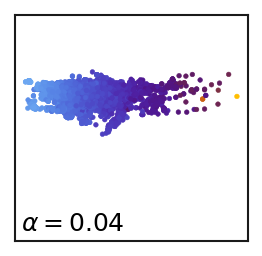

0.05 (-1.8, 1.0)


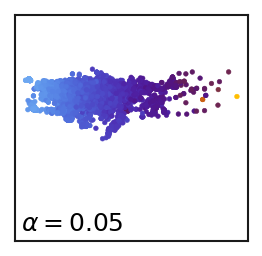

0.06 (-1.8, 1.0)


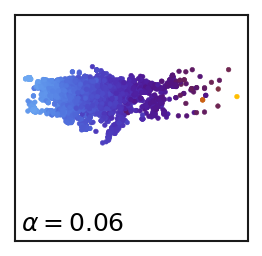

0.07 (-1.8, 1.0)


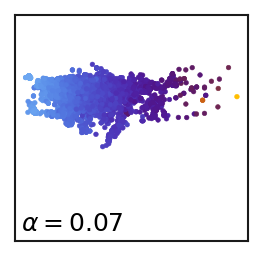

0.08 (-1.8, 1.0)


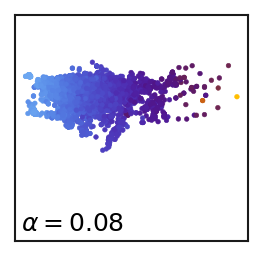

0.09 (-1.8, 1.0)


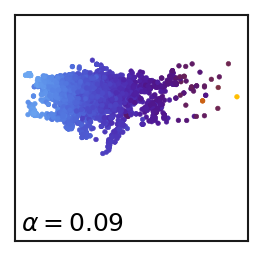

0.1 (-1.8, 1.0)


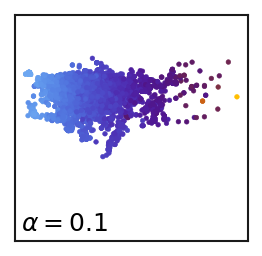

0.11 (-1.8, 1.0)


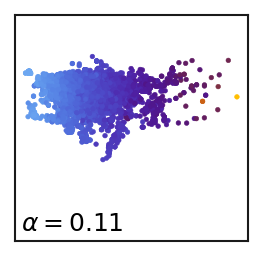

0.12 (-1.8, 1.0)


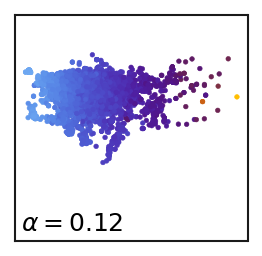

0.13 (-1.8, 1.0)


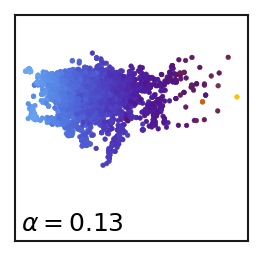

0.14 (-1.8, 1.0)


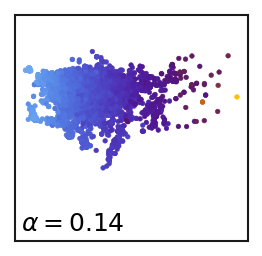

0.15 (-1.8, 1.0)


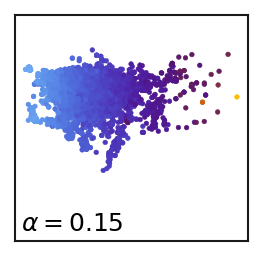

0.16 (-1.8, 1.0)


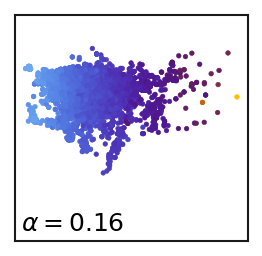

0.17 (-1.8, 1.0)


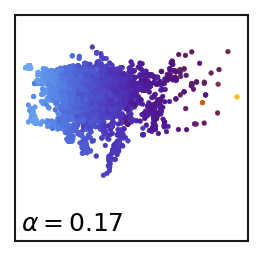

0.18 (-1.8, 1.0)


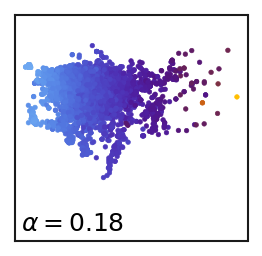

0.19 (-1.8, 1.0)


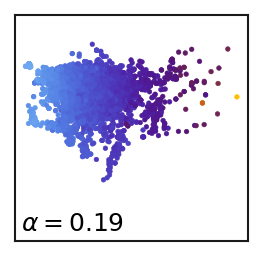

0.2 (-1.8, 1.0)


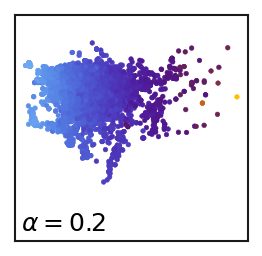

0.21 (-1.8, 1.0)


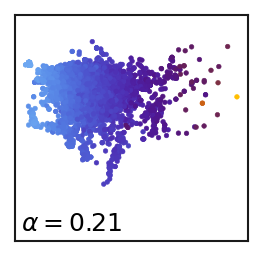

0.22 (-1.8, 1.0)


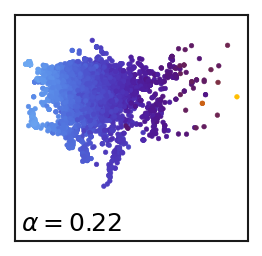

0.23 (-1.8, 1.0)


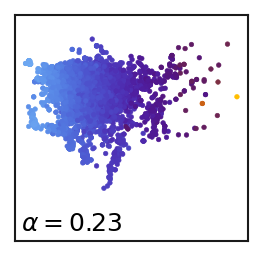

0.24 (-1.8, 1.0)


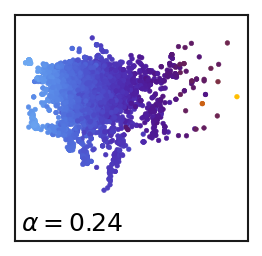

0.25 (-1.8, 1.0)


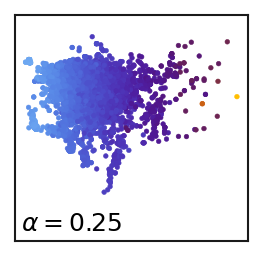

0.26 (-1.8, 1.0)


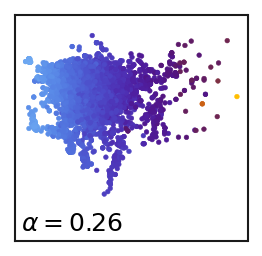

0.27 (-1.8, 1.0)


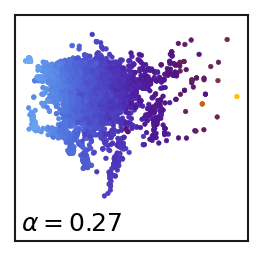

0.28 (-1.8, 1.0)


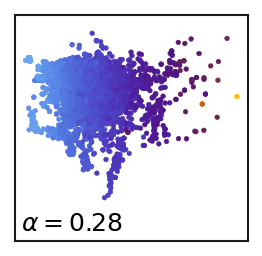

0.29 (-1.8, 1.0)


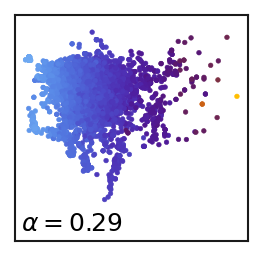

0.3 (-1.8, 1.0)


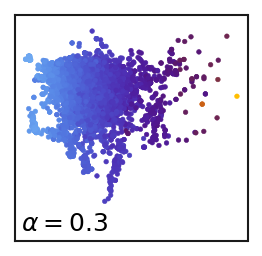

0.31 (-1.8, 1.0)


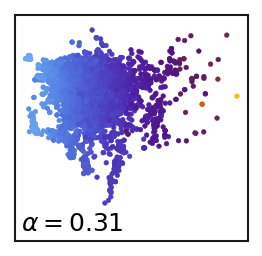

0.32 (-1.8, 1.0)


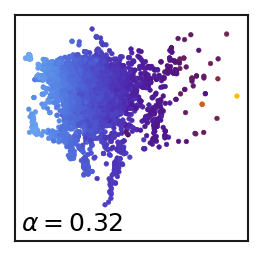

0.33 (-1.8, 1.0)


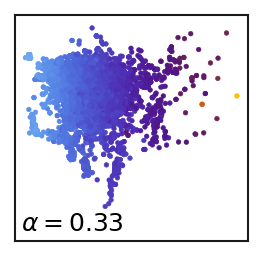

0.34 (-1.8, 1.0)


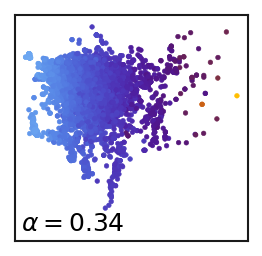

0.35 (-1.8, 1.0)


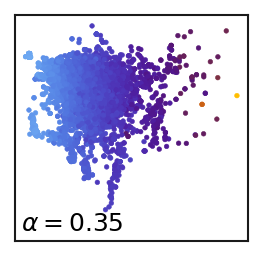

0.36 (-1.8, 1.0)


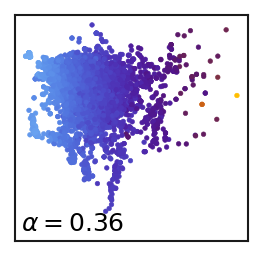

0.37 (-1.8, 1.0001661174055176)


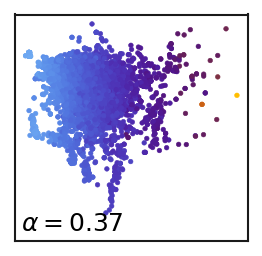

0.38 (-1.8, 1.013658100428699)


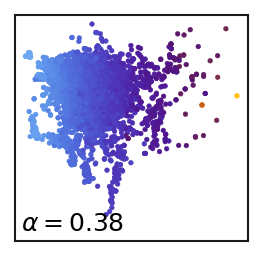

0.39 (-1.8, 1.0269781182401916)


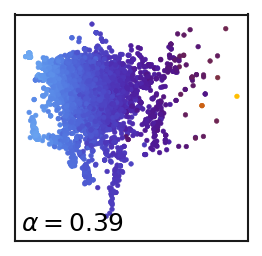

0.4 (-1.8, 1.0401329217000144)


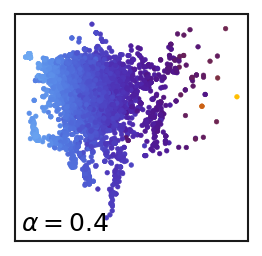

0.41 (-1.8, 1.0531288290471044)


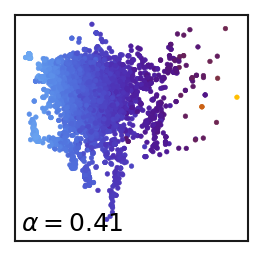

0.42 (-1.8, 1.0659717555576846)


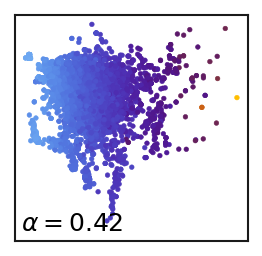

0.43 (-1.8, 1.0786672378723752)


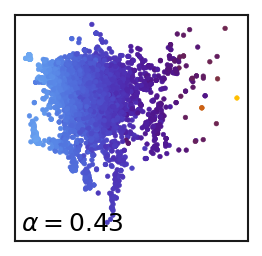

0.44 (-1.8, 1.0912204529915228)


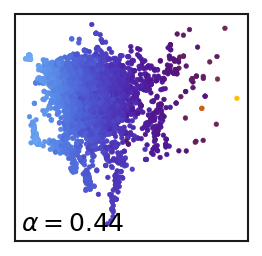

0.45 (-1.8, 1.1036362317632353)


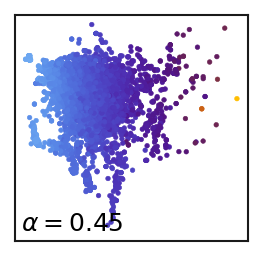

0.46 (-1.8, 1.1159190664145213)


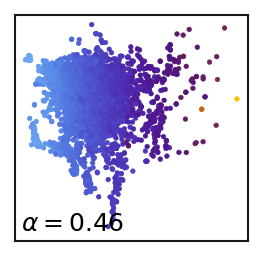

0.47 (-1.8, 1.128073111357903)


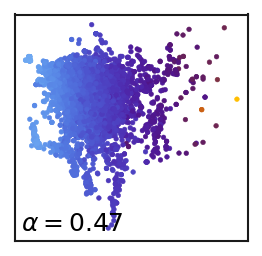

0.48 (-1.8, 1.1401021761080337)


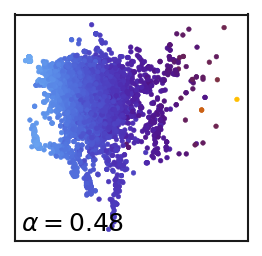

0.49 (-1.8, 1.152009708641799)


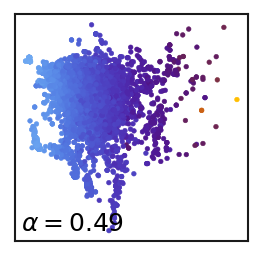

0.5 (-1.8164640982021707, 1.1637987667315208)


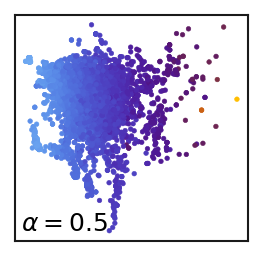

0.51 (-1.8335646543828474, 1.1754719738657424)


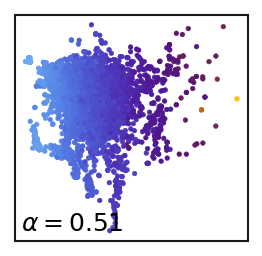

0.52 (-1.8503769548026083, 1.1870314549176182)


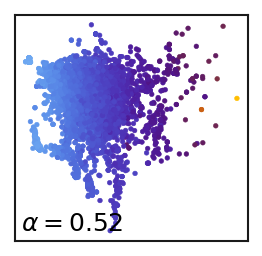

0.53 (-1.8668902366850646, 1.1984787447301617)


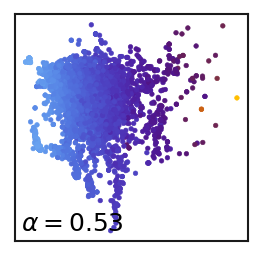

0.54 (-1.883090399964687, 1.2098146598859632)


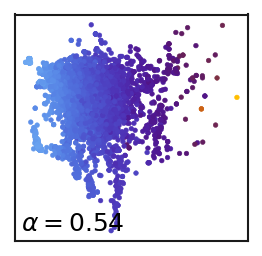

0.55 (-1.8989592507707622, 1.221039119749913)


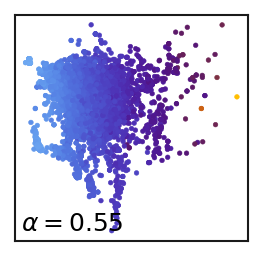

0.56 (-1.9147791777351792, 1.2385699851669838)


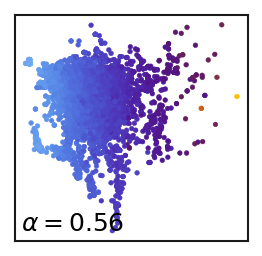

0.57 (-1.9303292869366588, 1.2583892505190994)


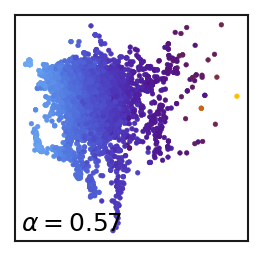

0.58 (-1.9455072770286144, 1.2791390751832012)


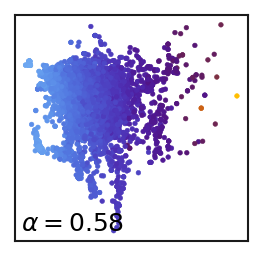

0.59 (-1.9602725095223197, 1.3009759461877346)


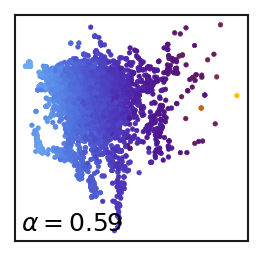

0.6 (-1.974572173109335, 1.3240883622327155)


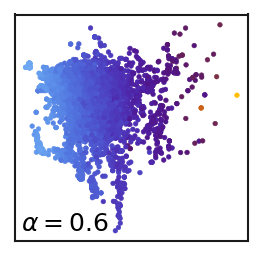

0.61 (-1.9883371631059992, 1.3487053488775038)


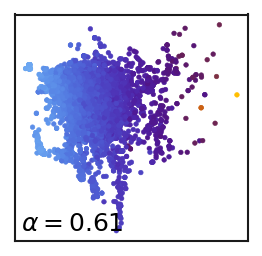

0.62 (-2.0014762131651245, 1.375107697387824)


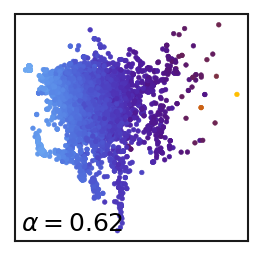

0.63 (-2.0138673935662634, 1.4036429245168358)


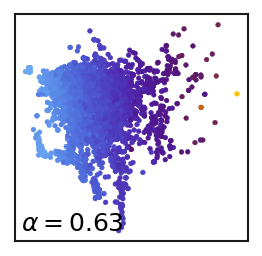

0.64 (-2.0253455636678104, 1.4347453339061522)


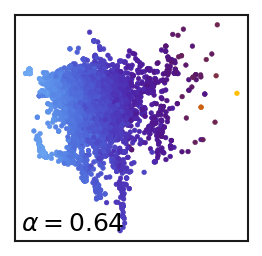

0.65 (-2.0356834798195016, 1.4689630634846476)


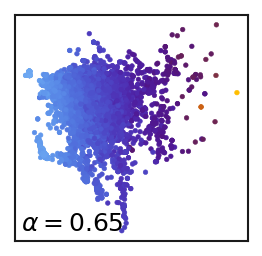

0.66 (-2.0445627402763162, 1.5069946005034522)


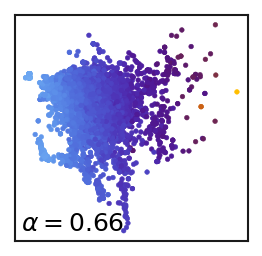

0.67 (-2.0515280981951514, 1.5497377626235083)


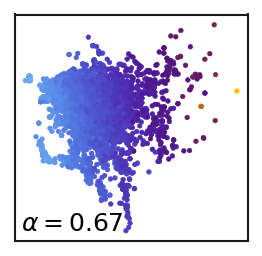

0.68 (-2.0559139987075263, 1.5983539659806278)


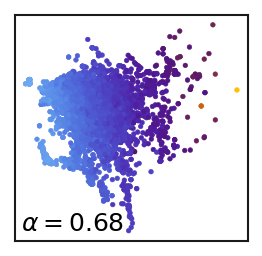

0.69 (-2.056723956637326, 1.6543478754063008)


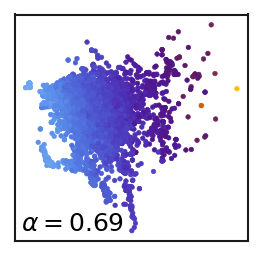

0.7 (-2.052429277010282, 1.7196520258025392)


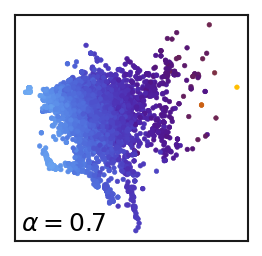

0.71 (-2.0406317635390376, 1.7966736789020483)


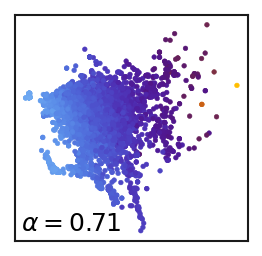

0.72 (-2.0175120159217155, 1.8881721480356937)


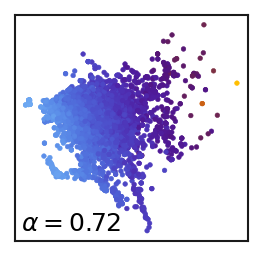

0.73 (-1.977010547670229, 1.9966173191053693)


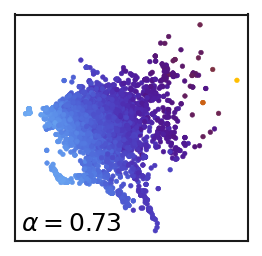

0.74 (-1.9099710011816962, 2.1222689172101106)


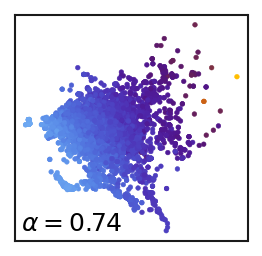

0.75 (-1.8045660001632529, 2.258988009721217)


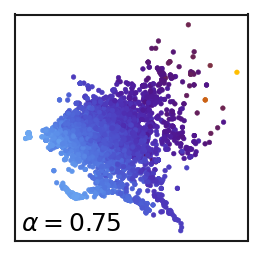

0.76 (-1.8, 2.38892172751952)


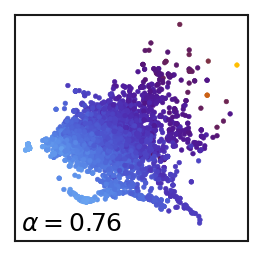

0.77 (-1.8, 2.4842887756902194)


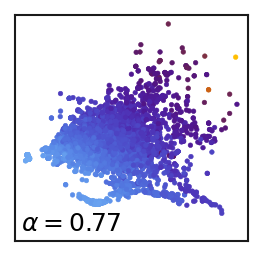

0.78 (-1.8, 2.527034549574935)


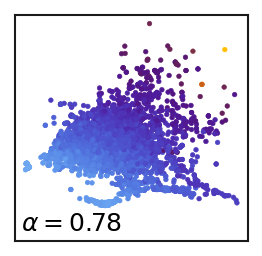

0.79 (-1.8, 2.5223977245403324)


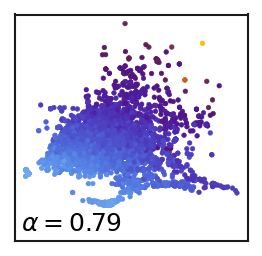

0.8 (-1.8, 2.477741758314071)


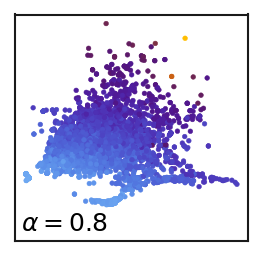

0.81 (-1.8, 2.408036172272173)


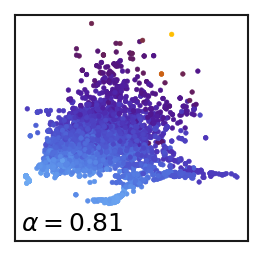

0.82 (-1.8, 2.3224194882139995)


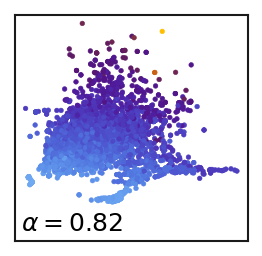

0.83 (-1.8, 2.2244192737859843)


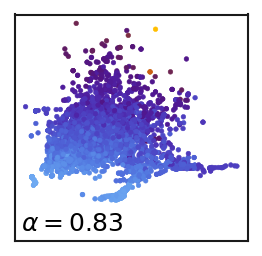

0.84 (-1.8, 2.113706193223295)


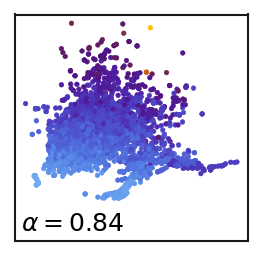

0.85 (-1.8, 2.105921649663618)


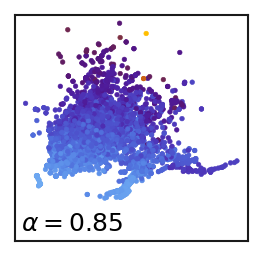

0.86 (-1.8, 2.1039436482597265)


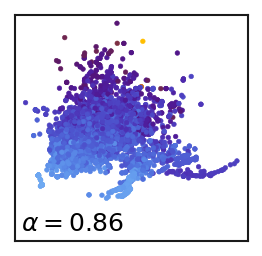

0.87 (-1.8, 2.0892196907717056)


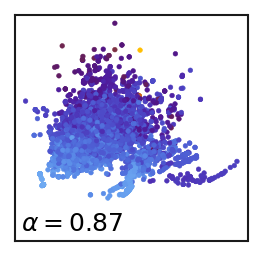

0.88 (-1.8, 2.057662336817348)


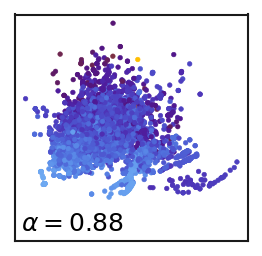

0.89 (-1.8, 2.014508239042437)


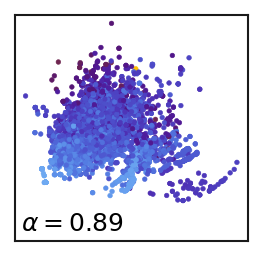

0.9 (-1.8, 1.9651872635054257)


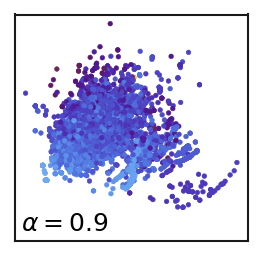

0.91 (-1.8, 1.9135677154058548)


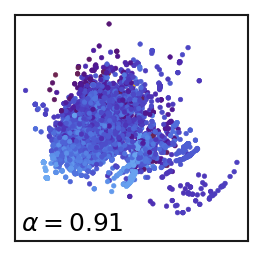

0.92 (-1.8, 1.8652938509860912)


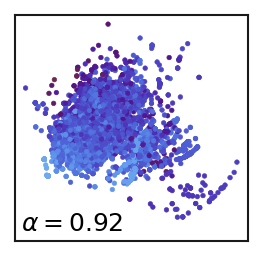

0.93 (-1.8, 1.8227819879528135)


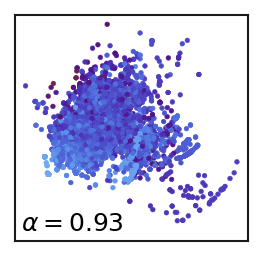

0.94 (-1.8, 1.7866499598398313)


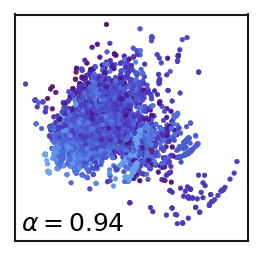

0.95 (-1.8, 1.7565132661289289)


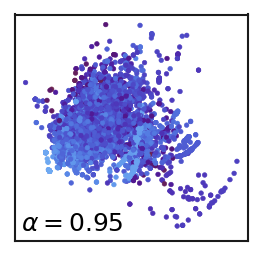

0.96 (-1.8, 1.768140482240098)


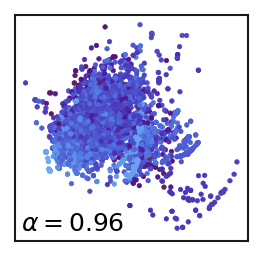

0.97 (-1.8, 1.7888995649437656)


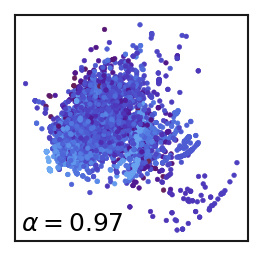

0.98 (-1.815794236274937, 1.8070582997132834)


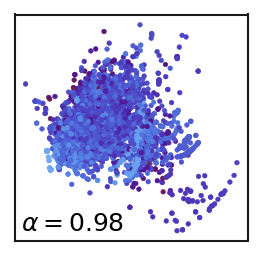

0.99 (-1.8393022106841665, 1.8233139354831005)


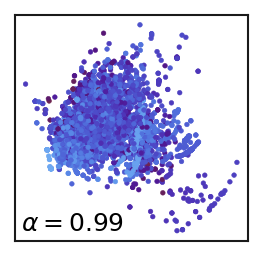

1.0 (-1.8604723645672123, 1.8381489860977978)


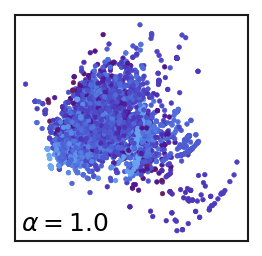

In [53]:
from shutil import copy

if(not os.path.exists(job.fn('figures/for_gif/reversed_projections'))):
    os.mkdir(job.fn('figures/for_gif/reversed_projections'))
    
for alpha in tqdm(alphas):
    fn = 'figures/for_gif/reversed_projections/pcovr_%0.8f'%(1-alpha) + '.png'
    if(not job.isfile(fn)):

        fig, ax = plt.subplots(figsize=(2,2))
        
        T = proj_data[alpha]['T_test'][:, :2]
        if(alpha in fx):
            T = np.matmul(T, [[-1, 0], [0, 1]])
        if(alpha in fy):
            T = np.matmul(T, [[1, 0], [0, -1]])
            
        if(Y_test.shape[-1] == 1):
            vmin, vmax = Y_test.min(axis=0), Y_test.max(axis=0)
        else:
            vmin = Y_test.mean(axis=0) - 2*Y_test.std(axis=0)
            vmax = Y_test.mean(axis=0) + 2*Y_test.std(axis=0)   
        
        plot_projection(
            Y=Y_test,
            T=T,
            fig=fig, ax=ax,
            vmin=vmin, vmax=vmax,
            cbar=False,
            x_label=r'',
            y_label=r'',
            marker='o',
            rasterized=True,
            **scp
        )
        
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_ylim([min(-1.8, ax.get_ylim()[0]),max(1.0, ax.get_ylim()[1])])
        print(alpha, ax.get_ylim())
        ax.annotate(xy=(0.025, 0.025), text=r'$\alpha=$'+str(round(alpha, precision)),
                xycoords='axes fraction',
                     horizontalalignment='left',va='bottom',
                    )
        
        fig.savefig(job.fn(fn))
        plt.show()
#         break
    if(alpha in [0.0,1.0]):
        for l in 'ABCDEFGHIJ':
            copy(job.fn(fn), job.fn(fn.replace('0.png', l+'.png')))

In [11]:
# folder = job.fn('figures/for_gif/regressions/')
# if(not os.path.exists(folder)):
#     os.mkdir(folder)

# for alpha in tqdm(alphas):
#     fn = folder+'pcovr_regr_%0.8f'%alpha + '.png'
#     if(not job.isfile(fn)):
#         n_prop = len(job.document.property_name)
#         fig, ax = plt.subplots(n_prop, 1, 
#                                figsize=(2,2*n_prop))
#         if(n_prop==1):
#             ax = np.reshape([ax], (1,))
            
#         for pi, prop in enumerate(job.document.property_name):
#             plot_regression(Y=Y_test[:,pi], 
#                             Yp=proj_data[alpha]["Yp_test"][:,pi], 
#                             cbar=False, **scp,
#                             fig=fig, ax=ax[pi])
#             ax[pi].set_yticks([])
#             ax[pi].set_xticks([])
#             ax[pi].set_ylabel(r'$\mathbf{XP}_{XY}$')
#             ax[pi].set_xlabel('')
            
#             xlim = ax[pi].get_xlim()
            
#             s = '{}\n[{}]'.format(prop , job.document.property_units[pi])
#             ax[pi].text(x=0.975*(xlim[1]-xlim[0])+xlim[0],
#                         y=0.05*(xlim[1]-xlim[0])+xlim[0],
#                         s=s,
#                         horizontalalignment='right',
#                        )
        
#         ax[-1].set_xlabel(r'$\mathbf{Y}$')
#         ax[0].set_title(r'$\alpha=$'+str(round(alpha, precision)),
#                      horizontalalignment='left',loc='left',
#                     )
#         fig.savefig(fn)
#         plt.show()
#     if(alpha in [0.0,1.0]):
#         for l in 'ABCDEFGHIJ':
#             copy(fn, fn.replace('0.png', l+'.png'))
            

In [12]:
folder = job.fn('figures/for_gif/dual/')

if(not os.path.exists(folder)):
    os.mkdir(folder)
    
for alpha in tqdm(alphas):
    fn = folder+'pcovr_%0.8f'%alpha + '.png'
    if(not job.isfile(fn)):
        n_prop = len(job.document.property_name)

        if(n_prop<4):
            fig, ax = plt.subplots(n_prop+1, 1, figsize=(2, 2.4*n_prop+2))

        else:
            # only works for qm9
            from matplotlib import gridspec
            fig = plt.figure(figsize=(8,8))
            gs = gridspec.GridSpec(4,4)
            ax = [fig.add_subplot(gs[:2, :2]), 
                  *[fig.add_subplot(gs[i, j]) for i in range(4) for j in range(4) if i >1 or j>1]]
        T = proj_data[alpha]['T_test'][:, :2]
        if(alpha in fx):
            T = np.matmul(T, [[-1, 0], [0, 1]])
        if(alpha in fy):
            T = np.matmul(T, [[1, 0], [0, -1]])

        if(Y_test.shape[-1] == 1):
            vmin, vmax = Y_test.min(axis=0), Y_test.max(axis=0)
        else:
            vmin = Y_test.mean(axis=0) - 2*Y_test.std(axis=0)
            vmax = Y_test.mean(axis=0) + 2*Y_test.std(axis=0)   

        plot_projection(
            Y=Y_test,
            T=T,
            fig=fig, ax=ax[0],
            vmin=vmin, vmax=vmax,
            cbar=False,
            x_label=r'$\mathbf{PC}_2$',
            y_label=r'$\mathbf{PC}_1$',
            marker='o',
            rasterized=True,
            **scp
        )

        ax[0].set_xticks([])
        ax[0].set_yticks([])
        
        ax[0].set_title(r'$\alpha=$'+str(round(alpha, precision)),
                     horizontalalignment='left',loc='left',
                    )

        for pi, prop in enumerate(job.document.property_name):
            plot_regression(Y=Y_test[:,pi], 
                            Yp=proj_data[alpha]["Yp_test"][:,pi], 
                            cbar=False, x_label='', y_label='',
                            **scp, fig=fig, ax=ax[pi+1])
            ax[pi+1].set_yticks([])
            ax[pi+1].set_xticks([])
            ax[pi+1].set_xlabel('')
            
            
            xlim = ax[pi+1].get_xlim()
            
            s = '{}\n[{}]'.format(prop , job.document.property_units[pi])
            ax[pi+1].text(x=0.975*(xlim[1]-xlim[0])+xlim[0],
                        y=0.05*(xlim[1]-xlim[0])+xlim[0],
                        s=s,
                        horizontalalignment='right',
                       )
            if(n_prop < 4):
                ax[pi+1].set_ylabel(r'$\mathbf{XP}_{XY}$')
                ax[pi+1].set_xlabel(r'$\mathbf{Y}$')
        if(n_prop < 4):
            fig.subplots_adjust(hspace=0.3, wspace=0.2)
        else:
            ax[0].xaxis.set_label_position('top')
            fig.subplots_adjust(hspace=0.0, wspace=0.0)
        fig.savefig(fn)
        plt.show()
        
        break
    if(alpha in [0.0,1.0]):
        for l in 'ABCDEFGHIJ':
            copy(fn, fn.replace('0.png', l+'.png'))

/var/folders/wj/7rfv11952g53zf6ztk8k8g980000gn/T/ipykernel_82267/3026622825.py:6: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for alpha in tqdm(alphas):


  0%|          | 0/101 [00:00<?, ?it/s]

In [ ]:
! convert -delay 10 -loop 0 ../../workspace/{job._id}/figures/for_gif/dual/*png ../../workspace/{job._id}/figures/for_gif/dual.gif

# KPCovR

In [ ]:
test = np.load(job.fn('testing.npz'))
train = np.load(job.fn('training.npz'))
print(test['X'].shape)

X_test = test["X"]
Y_test = test["Y"]
X_train = train["X"]
Y_train = train["Y"]
print(test['X'].shape)

try:
    assert "K" in test
    K_test = test["K"]
    K_train = train["K"]
except:
    print("This job is not equipped for this.")

In [ ]:
Y_hat = np.load(job.fn('model_caches/krr_data.npz'))['Yp_train']#[:2000, :]
if(job.isfile('figures/for_gif/kpcovr_data.npz')):
    d = np.load(job.fn('figures/for_gif/kpcovr_data.npz'), allow_pickle=True)
    kproj_data = {float(x): d[x].item() for x in d if 'flip' not in x and x!='checked'}
    fx = list(d['flip_x'])
    fy = list(d['flip_y'])
else:
    kproj_data = {}
    fx = []; fy = [];

In [ ]:
for ai, alpha in enumerate(tqdm(alphas)):
    if(alpha not in kproj_data):
        p = KPCovR(alpha = alpha, 
                  regularization=job.document.regularization_param,
                  n_PC = job.sp.n_PC,
                  kernel_type=lambda x1, x2: None
                 )
        p.fit(X=X_train, Y=Y_train, K=K_train, Yhat=Y_hat)
        t, y, _ = p.transform(X=X_test, K=K_test)
        kproj_data[alpha] = {"T_test": t, "Yp_test": y}

In [ ]:
fx, fy = check_all_mirrors([], [], alphas, kproj_data)

In [ ]:
x=plot_projs(job, 'kpcovr', 
           proj_data=kproj_data, 
           alphas=alphas, Y_test=Y_test,
           flip_x = fx, flip_y = fy,
           save=False)

In [ ]:
np.savez(job.fn('figures/for_gif/kpcovr_data.npz'), 
         **{str(x): kproj_data[x] for x in kproj_data}, 
         flip_x=fx, 
         flip_y=fy)

In [ ]:
# from shutil import copy

# if(not os.path.exists(job.fn('figures/for_gif/kprojections'))):
#     os.mkdir(job.fn('figures/for_gif/kprojections'))
    
# for alpha in tqdm(alphas):
#     fn = 'figures/for_gif/kprojections/kpcovr_%0.8f'%alpha + '.png'
#     if(not job.isfile(fn)):

#         fig, ax = plt.subplots(figsize=(2,2))
        
#         T = kproj_data[alpha]['T_test'][:, :2]
#         if(alpha in fx):
#             T = np.matmul(T, [[-1, 0], [0, 1]])
#         if(alpha in fy):
#             T = np.matmul(T, [[1, 0], [0, -1]])
            
#         if(Y_test.shape[-1] == 1):
#             vmin, vmax = Y_test.min(axis=0), Y_test.max(axis=0)
#         else:
#             vmin = Y_test.mean(axis=0) - 2*Y_test.std(axis=0)
#             vmax = Y_test.mean(axis=0) + 2*Y_test.std(axis=0)   
        
#         plot_projection(
#             Y=Y_test,
#             T=T,
#             fig=fig, ax=ax,
#             vmin=vmin, vmax=vmax,
#             cbar=False,
#             x_label=r'$\mathbf{PC}_2$',
#             y_label=r'$\mathbf{PC}_1$',
#             marker='o',
#             rasterized=True,
#             **scp
#         )
        
#         ax.set_xticks([])
#         ax.set_yticks([])
#         ax.set_title(r'$\alpha=$'+str(round(alpha, precision)),
#                      horizontalalignment='left',loc='left',
#                     )
        
#         fig.savefig(job.fn(fn))
#         plt.show()
# #         break
#     if(alpha in [0.0,1.0]):
#         for l in 'ABCDEFGHIJ':
#             copy(job.fn(fn), job.fn(fn.replace('0.png', l+'.png')))

In [ ]:
# folder = job.fn('figures/for_gif/kregressions/')
# if(not os.path.exists(folder)):
#     os.mkdir(folder)

# for alpha in tqdm(alphas):
#     fn = folder+'pcovr_kregr_%0.8f'%alpha + '.png'
#     if(not job.isfile(fn)):
#         n_prop = len(job.document.property_name)
#         fig, ax = plt.subplots(n_prop, 1, 
#                                figsize=(2,2*n_prop))
#         if(n_prop==1):
#             ax = np.reshape([ax], (1,))
            
#         for pi, prop in enumerate(job.document.property_name):
#             plot_regression(Y=Y_test[:,pi], 
#                             Yp=kproj_data[alpha]["Yp_test"][:,pi], 
#                             cbar=False, **scp,
#                             fig=fig, ax=ax[pi])
#             ax[pi].set_yticks([])
#             ax[pi].set_xticks([])
#             ax[pi].set_ylabel(r'$\mathbf{KP}_{KY}$')
#             ax[pi].set_xlabel('')
            
#             xlim = ax[pi].get_xlim()
            
#             s = '{}\n[{}]'.format(prop , job.document.property_units[pi])
#             ax[pi].text(x=0.975*(xlim[1]-xlim[0])+xlim[0],
#                         y=0.05*(xlim[1]-xlim[0])+xlim[0],
#                         s=s,
#                         horizontalalignment='right',
#                        )
        
#         ax[-1].set_xlabel(r'$\mathbf{Y}$')
#         ax[0].set_title(r'$\alpha=$'+str(round(alpha, precision)),
#                      horizontalalignment='left',loc='left',
#                     )
#         fig.savefig(fn)
#         plt.show()
#     if(alpha in [0.0,1.0]):
#         for l in 'ABCDEFGHIJ':
#             copy(fn, fn.replace('0.png', l+'.png'))
            

In [ ]:
from shutil import copy
folder = job.fn('figures/for_gif/kdual/')

if(not os.path.exists(folder)):
    os.mkdir(folder)
    
for alpha in tqdm(alphas):
    fn = folder+'kpcovr_%0.8f'%alpha + '.png'
    if(not job.isfile(fn)):
        n_prop = len(job.document.property_name)

        if(n_prop<4):
            fig, ax = plt.subplots(n_prop+1, 1, figsize=(2, 2.4*n_prop+2))

        else:
            # only works for qm9
            from matplotlib import gridspec
            fig = plt.figure(figsize=(4,4))
            gs = gridspec.GridSpec(4,4)
            ax = [fig.add_subplot(gs[:2, :2]), 
                  *[fig.add_subplot(gs[i, j]) for i in range(4) for j in range(4) if i >1 or j>1]]

        T = kproj_data[alpha]['T_test'][:, :2]
        if(alpha in fx):
            T = np.matmul(T, [[-1, 0], [0, 1]])
        if(alpha in fy):
            T = np.matmul(T, [[1, 0], [0, -1]])

        if(Y_test.shape[-1] == 1):
            vmin, vmax = Y_test.min(axis=0), Y_test.max(axis=0)
        else:
            vmin = Y_test.mean(axis=0) - 2*Y_test.std(axis=0)
            vmax = Y_test.mean(axis=0) + 2*Y_test.std(axis=0)   

        plot_projection(
            Y=Y_test,
            T=T,
            fig=fig, ax=ax[0],
            vmin=vmin, vmax=vmax,
            cbar=False,
            x_label=r'$\mathbf{PC}_2$',
            y_label=r'$\mathbf{PC}_1$',
            marker='o',
            rasterized=True,
            **scp
        )

        ax[0].set_xticks([])
        ax[0].set_yticks([])
        
        ax[0].set_title(r'$\alpha=$'+str(round(alpha, precision)),
                     horizontalalignment='left',loc='left',
                    )

        for pi, prop in enumerate(job.document.property_name):
            plot_regression(Y=Y_test[:,pi], 
                            Yp=kproj_data[alpha]["Yp_test"][:,pi], 
                            cbar=False,x_label = '', y_label = '',
                            **scp, fig=fig, ax=ax[pi+1])
            ax[pi+1].set_yticks([])
            ax[pi+1].set_xticks([])            
            
            xlim = ax[pi+1].get_xlim()
            
            s = '{}\n[{}]'.format(prop , job.document.property_units[pi])
            ax[pi+1].text(x=0.975*(xlim[1]-xlim[0])+xlim[0],
                        y=0.05*(xlim[1]-xlim[0])+xlim[0],
                        s=s, fontsize=10 if n_prop < 4 else 6,
                        horizontalalignment='right',
                       )
            if(n_prop < 4):
                ax[pi+1].set_ylabel(r'$\mathbf{KP}_{KY}$')
                ax[pi+1].set_xlabel(r'$\mathbf{Y}$')
                fig.subplots_adjust(hspace=0.3, wspace=0.2)
            else:
                ax[0].xaxis.set_label_position('top')
                fig.subplots_adjust(hspace=0.0, wspace=0.0)
        fig.savefig(fn)
        plt.show()
        
#         break
    if(alpha in [0.0,1.0]):
        for l in 'ABCDEFGHIJ':
            copy(fn, fn.replace('0.png', l+'.png'))

In [ ]:
! convert -delay 10 -loop 0 ../../workspace/{job._id}/figures/for_gif/kdual/*png ../../workspace/{job._id}/figures/for_gif/kdual.gif

In [ ]:
plt.rcParams